## Install libraries

In [ ]:
!python3 -m pip install paddlepaddle-gpu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 393.8 MB 26 kB/s 
     |████████████████████████████████| 394 kB 65.9 MB/s 


In [ ]:
!pip install "paddleocr>=2.0.1"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 334 kB 33.6 MB/s 
     |████████████████████████████████| 2.8 MB 70.9 MB/s 
     |████████████████████████████████| 50 kB 8.5 MB/s 
     |████████████████████████████████| 55.7 MB 66 kB/s 
     |████████████████████████████████| 604 kB 46.2 MB/s 
     |████████████████████████████████| 399 kB 73.7 MB/s 
     |████████████████████████████████| 204 kB 42.9 MB/s 
     |████████████████████████████████| 2.3 MB 66.7 MB/s 
  Created wheel for python-Levenshtein: filename=python_Levenshtein-0.12.2-cp37-cp37m-linux_x86_64.whl size=149866 sha256=ceb8cfd956116d71ec5324ab4cdd852c9b99faeddc61076d0695d04595864bef
  Stored in directory: /root/.cache/pip/wheels/05/5f/ca/7c4367734892581bb5ff896f15027a932c551080b2abd3e00d
Successfully built python-Levenshtein
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.6.0.6

## Import to Load PaddleOCR's pretrained Detection Models

In [1]:
from paddleocr import PaddleOCR,draw_ocr
# Paddleocr supports Chinese, English, French, German, Korean and Japanese.
# You can set the parameter `lang` as `ch`, `en`, `fr`, `german`, `korean`, `japan`
# to switch the language model in order.
ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory


[2023/08/10 16:25:06] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/Users/shashanksahoo/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/Users/shashanksahoo/.paddleocr/whl/rec/en/en_PP-OCRv3_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, 

In [3]:
# from google.colab.patches import cv2_imshow
# import cv2 to visualize image
import cv2
import matplotlib.pyplot as plt

## Taking Sample 1

#### Visualize sample 1 image before OCR

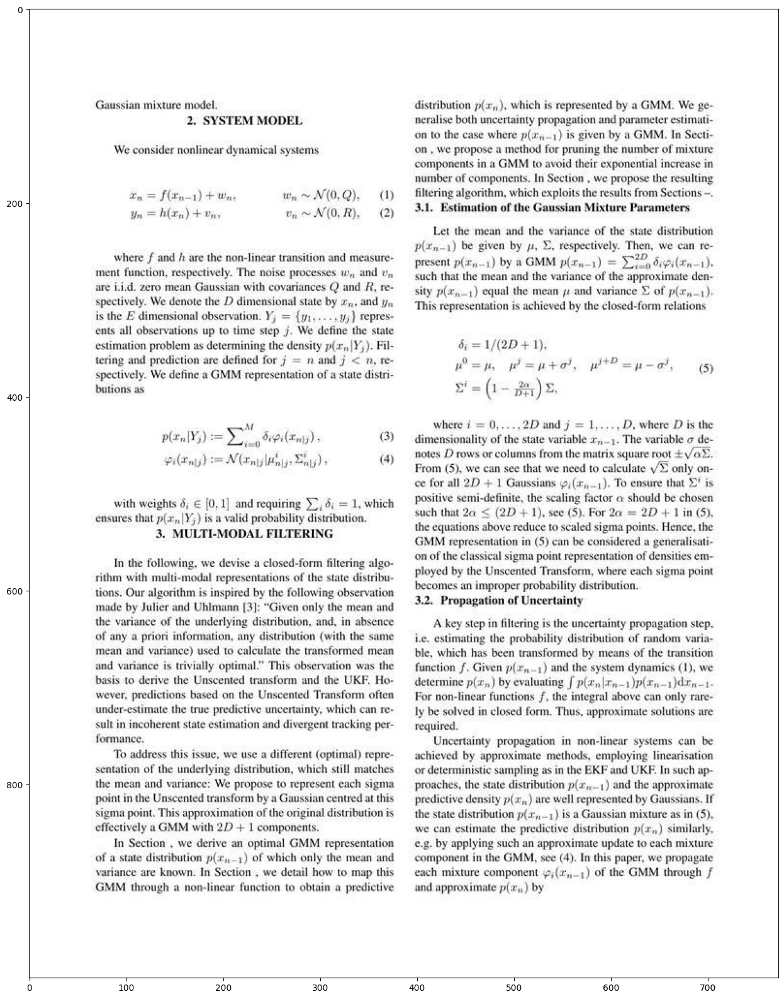

In [27]:
img_path = 'test_image_samples/1.tar_1401.0077.gz_Paper3_1_ori.jpg'

img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
plt.figure(figsize=(30,20))
plt.imshow(img)

#### Run inference with paddle OCR models on sample 1 for bounding box detection

In [28]:
%timeit 
result = ocr.ocr(img_path, cls=True)
for line in result:
    print(line)

[2023/08/10 18:16:04] ppocr DEBUG: dt_boxes num : 99, elapse : 0.4462699890136719
[2023/08/10 18:16:05] ppocr DEBUG: cls num  : 99, elapse : 0.8712189197540283
[2023/08/10 18:16:22] ppocr DEBUG: rec_res num  : 99, elapse : 17.53756809234619
[[[[66.0, 92.0], [196.0, 91.0], [196.0, 105.0], [66.0, 106.0]], ('Gaussian mixture model.', 0.9651298522949219)], [[[396.0, 92.0], [706.0, 92.0], [706.0, 105.0], [396.0, 105.0]], ('distribution pwhich is represented by a GMM.We ge-', 0.9367688894271851)], [[[160.0, 108.0], [283.0, 108.0], [283.0, 123.0], [160.0, 123.0]], ('2.SYSTEM MODEL', 0.964188277721405)], [[[397.0, 108.0], [707.0, 108.0], [707.0, 122.0], [397.0, 122.0]], ('neralise both uncertainty propagation and parameter estimati-', 0.9725829362869263)], [[[397.0, 124.0], [707.0, 124.0], [707.0, 138.0], [397.0, 138.0]], ('on to the case where pn-1 is given by a GMM.In Secti-', 0.9345839023590088)], [[[86.0, 137.0], [299.0, 139.0], [299.0, 153.0], [86.0, 152.0]], ('We consider nonlinear dynam

#### Visualize sample 1 image after OCR

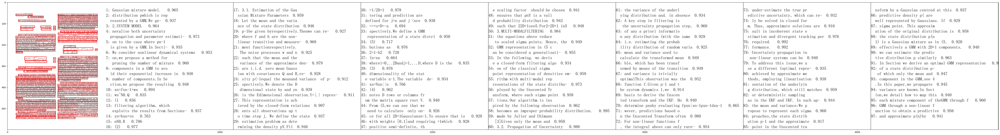

In [42]:
# draw result
from PIL import Image, ImageDraw, ImageFont

# draw result
from PIL import Image
image = Image.open(img_path).convert('RGB')
boxes = [detection[0] for line in result for detection in line] # Nested loop added
txts = [detection[1][0] for line in result for detection in line] # Nested loop added
scores = [detection[1][1] for line in result for detection in line] # Nested loop added

im_show = draw_ocr(image, boxes, txts, scores, font_path='simfang.ttf')
im_show = Image.fromarray(im_show)
im_show.save('test.jpg')
plt.figure(figsize=(80, 100))
plt.imshow(im_show)

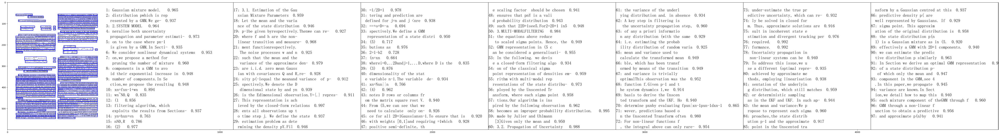

In [41]:
img = cv2.imread('test.jpg', cv2.IMREAD_UNCHANGED)
plt.figure(figsize=(80, 100))
plt.imshow(img)

## Taking Sample 2 

#### Visualize sample 2 image before OCR

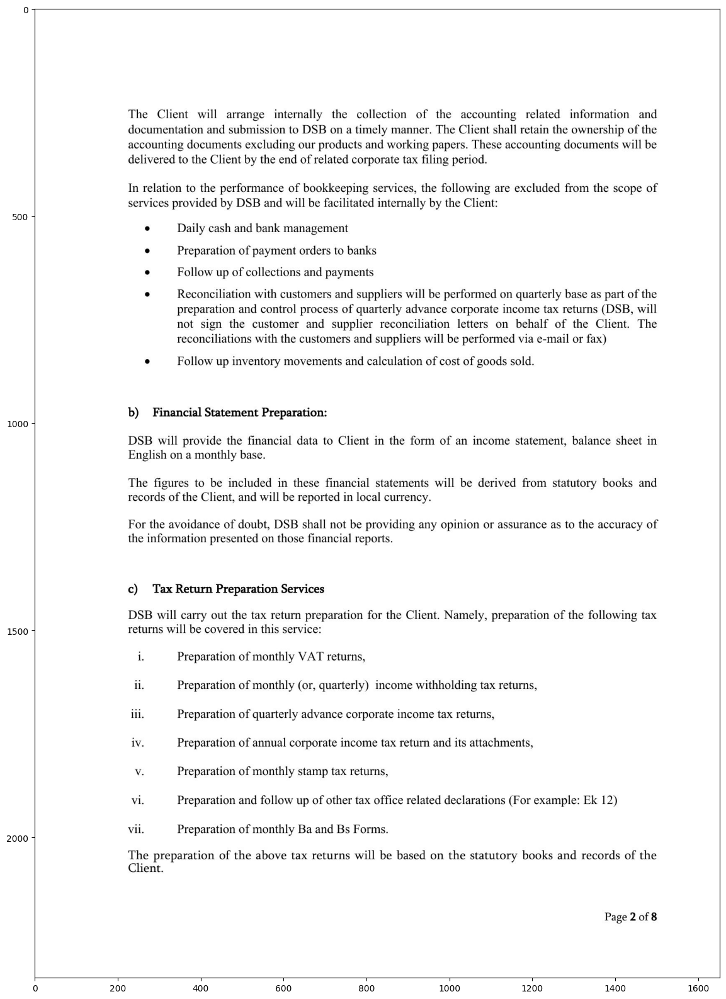

In [43]:
img_path = 'test_image_samples/out1.jpg'

img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
plt.figure(figsize=(30,20))
plt.imshow(img)

#### Run inference with paddle OCR models on sample 2 for bounding box detection

In [44]:
%timeit 
result = ocr.ocr(img_path, cls=True)
for line in result:
    print(line)

[2023/08/10 18:49:38] ppocr DEBUG: dt_boxes num : 41, elapse : 0.4947950839996338
[2023/08/10 18:49:38] ppocr DEBUG: cls num  : 41, elapse : 0.34153223037719727
[2023/08/10 18:49:51] ppocr DEBUG: rec_res num  : 41, elapse : 13.341447830200195
[[[[226.0, 239.0], [1503.0, 239.0], [1503.0, 270.0], [226.0, 270.0]], ('The Client will arrange internally the collection of the accounting related information and', 0.9712806344032288)], [[[229.0, 280.0], [1496.0, 280.0], [1496.0, 305.0], [229.0, 305.0]], ('documentation and submission to DSB on a timely manner. The Client shall retain the ownership of the', 0.9559525847434998)], [[[224.0, 346.0], [1090.0, 346.0], [1090.0, 378.0], [224.0, 378.0]], ('delivered to the Client by the end of related corporate tax filing period.', 0.9924588799476624)], [[[221.0, 414.0], [1503.0, 417.0], [1503.0, 451.0], [221.0, 448.0]], ('In relation to the performance of bookkeeping services, the following are excluded from the scope of', 0.9897122979164124)], [[[221.

#### Visualize sample 2 image after OCR

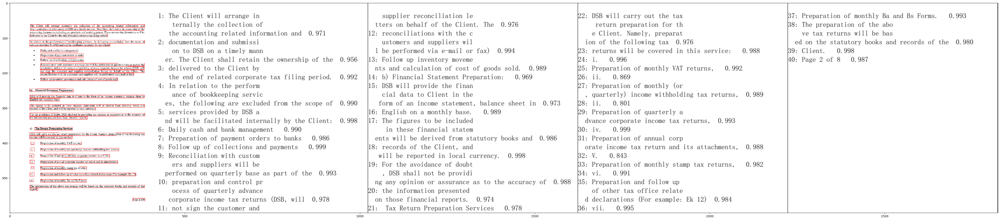

In [46]:
# draw result
from PIL import Image, ImageDraw, ImageFont

# draw result
from PIL import Image
image = Image.open(img_path).convert('RGB')
boxes = [detection[0] for line in result for detection in line] # Nested loop added
txts = [detection[1][0] for line in result for detection in line] # Nested loop added
scores = [detection[1][1] for line in result for detection in line] # Nested loop added

im_show = draw_ocr(image, boxes, txts, scores, font_path='simfang.ttf')
im_show = Image.fromarray(im_show)
im_show.save('test.jpg')
plt.figure(figsize=(60, 80))
plt.imshow(im_show)

## Taking Sample 3

#### Visualize sample 3 image before OCR

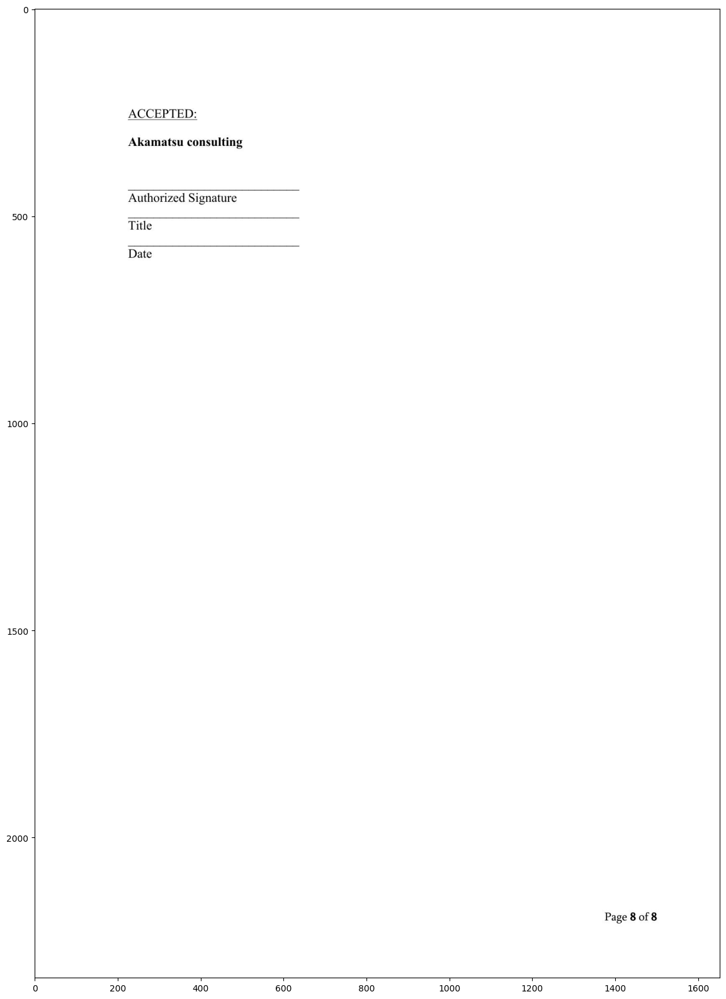

In [47]:
img_path = 'test_image_samples/out7.jpg'

img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
plt.figure(figsize=(30,20))
plt.imshow(img)

#### Run inference with paddle OCR models on sample 3 for bounding box detection

In [48]:
%timeit 
result = ocr.ocr(img_path, cls=True)
for line in result:
    print(line)

[2023/08/10 18:57:55] ppocr DEBUG: dt_boxes num : 6, elapse : 0.5350010395050049
[2023/08/10 18:57:55] ppocr DEBUG: cls num  : 6, elapse : 0.04617595672607422
[2023/08/10 18:57:55] ppocr DEBUG: rec_res num  : 6, elapse : 0.4696388244628906
[[[[222.0, 231.0], [396.0, 237.0], [395.0, 271.0], [221.0, 265.0]], ('ACCEPTED:', 0.999805748462677)], [[[222.0, 302.0], [507.0, 307.0], [506.0, 341.0], [221.0, 336.0]], ('Akamatsu consulting', 0.9979607462882996)], [[[222.0, 436.0], [490.0, 444.0], [489.0, 478.0], [221.0, 470.0]], ('Authorized Signature', 0.9997174143791199)], [[[222.0, 501.0], [289.0, 508.0], [285.0, 544.0], [218.0, 537.0]], ('Title', 0.996756911277771)], [[[220.0, 569.0], [292.0, 579.0], [287.0, 616.0], [215.0, 605.0]], ('Date', 0.9983844757080078)], [[[1373.0, 2176.0], [1505.0, 2176.0], [1505.0, 2210.0], [1373.0, 2210.0]], ('Page 8 of 8', 0.9883500933647156)]]


#### Visualize sample 3 image after OCR

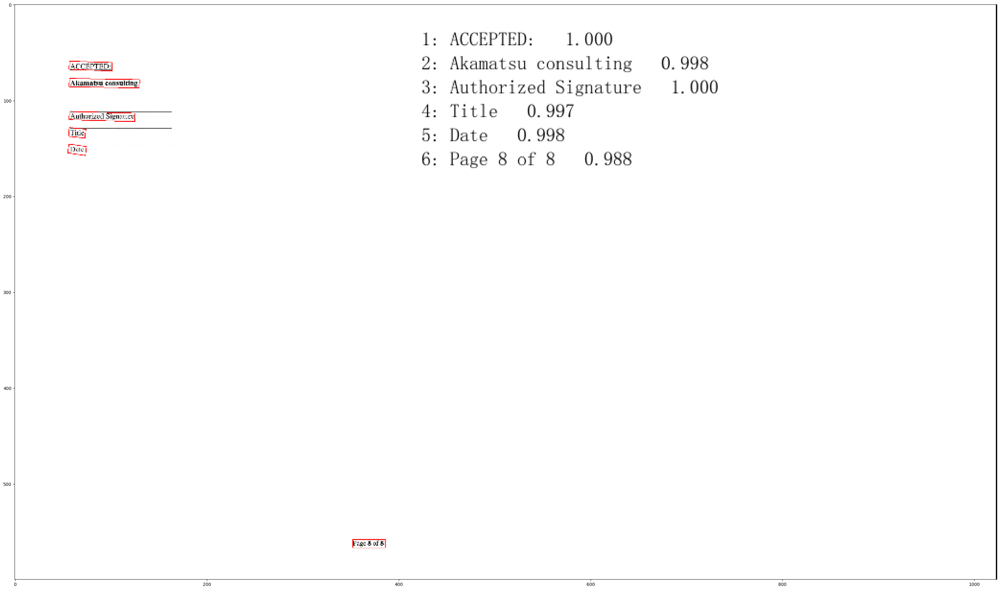

In [50]:
# draw result
from PIL import Image, ImageDraw, ImageFont

# draw result
from PIL import Image
image = Image.open(img_path).convert('RGB')
boxes = [detection[0] for line in result for detection in line] # Nested loop added
txts = [detection[1][0] for line in result for detection in line] # Nested loop added
scores = [detection[1][1] for line in result for detection in line] # Nested loop added

im_show = draw_ocr(image, boxes, txts, scores, font_path='simfang.ttf')
im_show = Image.fromarray(im_show)
im_show.save('test.jpg')
plt.figure(figsize=(40, 50))
plt.imshow(im_show)

## Taking Sample 4

#### Visualize sample 4 image before OCR

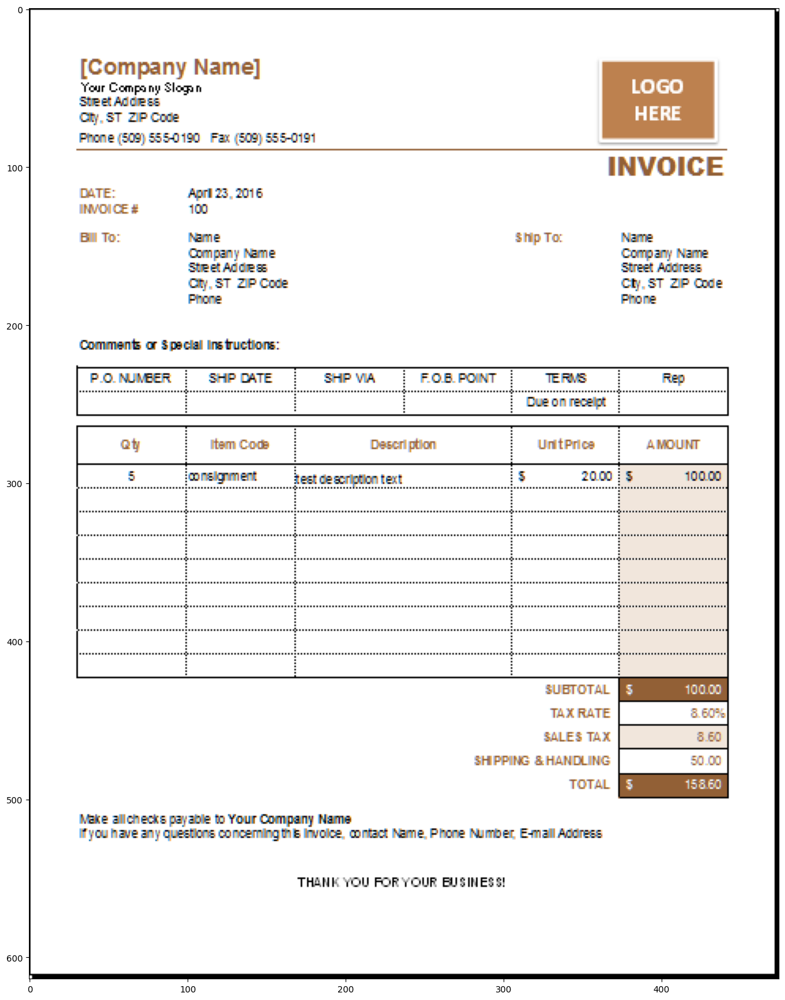

In [53]:
img_path = 'test_image_samples/invoice_sample.png'

img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
plt.figure(figsize=(30,20))
plt.imshow(img)

#### Run inference with paddle OCR models on sample 4 for bounding box detection

In [54]:
%timeit 
result = ocr.ocr(img_path, cls=True)
for line in result:
    print(line)

[2023/08/10 19:11:59] ppocr DEBUG: dt_boxes num : 56, elapse : 0.22411489486694336
[2023/08/10 19:11:59] ppocr DEBUG: cls num  : 56, elapse : 0.41533613204956055
[2023/08/10 19:12:04] ppocr DEBUG: rec_res num  : 56, elapse : 4.199032783508301
[[[[33.0, 30.0], [146.0, 30.0], [146.0, 44.0], [33.0, 44.0]], ('[Company Name]', 0.9857255220413208)], [[[31.0, 42.0], [112.0, 45.0], [112.0, 58.0], [31.0, 55.0]], ('Your Compo ny Sloga n', 0.9570328593254089)], [[[381.0, 43.0], [415.0, 43.0], [415.0, 55.0], [381.0, 55.0]], ('LOGO', 0.9960026741027832)], [[[32.0, 54.0], [85.0, 54.0], [85.0, 65.0], [32.0, 65.0]], ('Steet Addeas', 0.9064239859580994)], [[[31.0, 64.0], [96.0, 64.0], [96.0, 75.0], [31.0, 75.0]], ('Cty ST ZIP Code', 0.9495322704315186)], [[[382.0, 59.0], [416.0, 59.0], [416.0, 73.0], [382.0, 73.0]], ('HERE', 0.9982980489730835)], [[[30.0, 76.0], [183.0, 76.0], [183.0, 89.0], [30.0, 89.0]], ('Phon e [509] 555-0 190 Fax ([509] 555-0191', 0.8970332145690918)], [[[364.0, 92.0], [441.0, 90.

#### Visualize sample 4 image after OCR

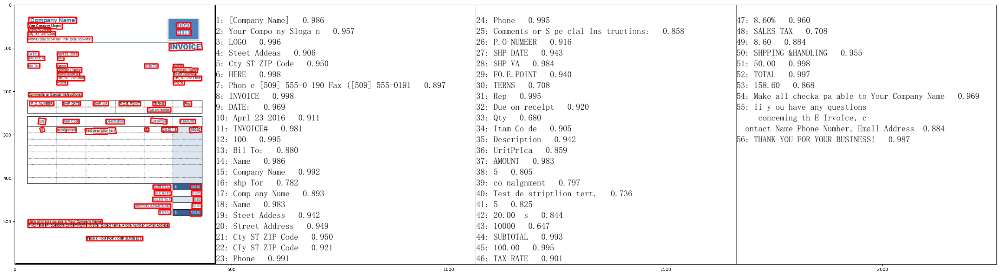

In [55]:
# draw result
from PIL import Image, ImageDraw, ImageFont

# draw result
from PIL import Image
image = Image.open(img_path).convert('RGB')
boxes = [detection[0] for line in result for detection in line] # Nested loop added
txts = [detection[1][0] for line in result for detection in line] # Nested loop added
scores = [detection[1][1] for line in result for detection in line] # Nested loop added

im_show = draw_ocr(image, boxes, txts, scores, font_path='simfang.ttf')
im_show = Image.fromarray(im_show)
im_show.save('test.jpg')
plt.figure(figsize=(40, 50))
plt.imshow(im_show)

## Taking Sample 5

#### Visualize sample 5 image before OCR

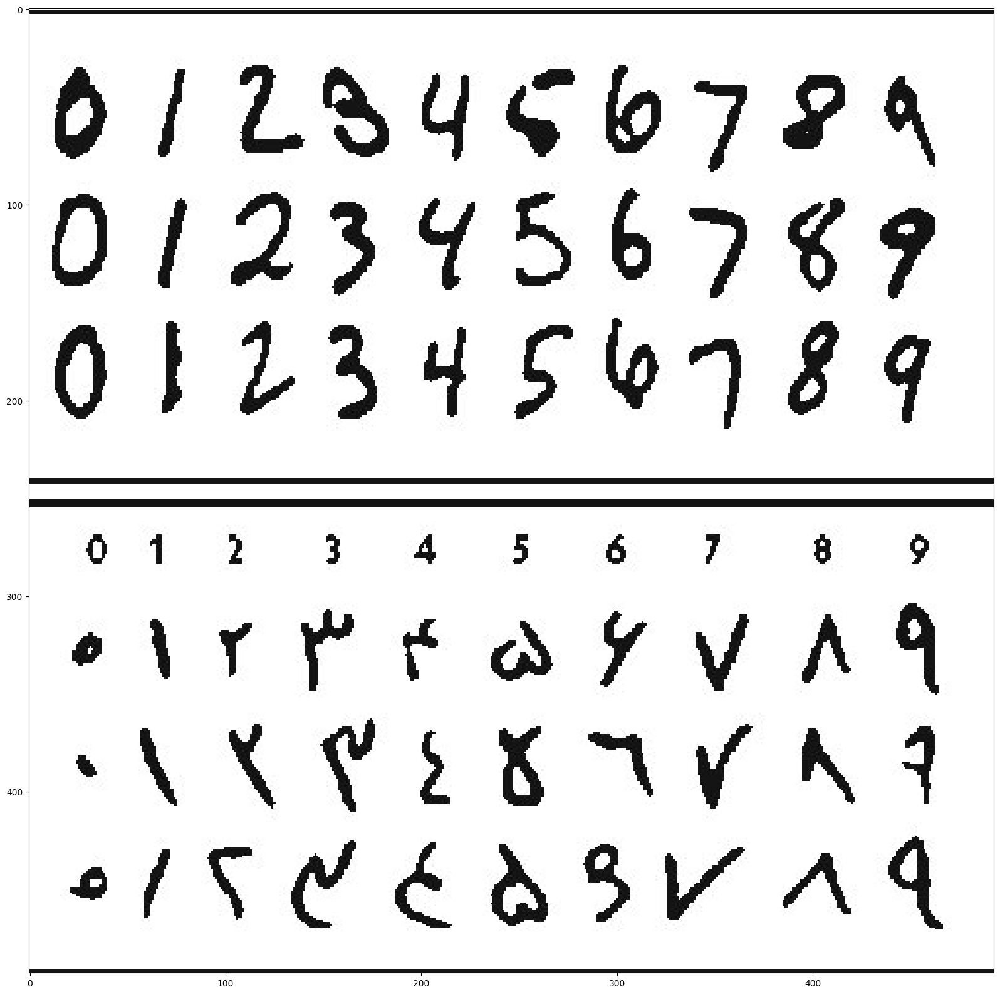

In [56]:
img_path = 'test_image_samples/handwritten-digits.jpg'

img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
plt.figure(figsize=(30,20))
plt.imshow(img)

#### Run inference with paddle OCR models on sample 5 for bounding box detection

In [57]:
%timeit 
result = ocr.ocr(img_path, cls=True)
for line in result:
    print(line)

[2023/08/10 19:14:28] ppocr DEBUG: dt_boxes num : 18, elapse : 0.16955113410949707
[2023/08/10 19:14:28] ppocr DEBUG: cls num  : 18, elapse : 0.14249014854431152
[2023/08/10 19:14:29] ppocr DEBUG: rec_res num  : 18, elapse : 1.4646737575531006
[[[[15.0, 29.0], [460.0, 35.0], [460.0, 77.0], [14.0, 71.0]], ('0/2345078a', 0.7334720492362976)], [[[11.0, 92.0], [463.0, 97.0], [463.0, 145.0], [10.0, 141.0]], ('0123456789', 0.9164535403251648)], [[[15.0, 160.0], [459.0, 164.0], [459.0, 209.0], [14.0, 204.0]], ('0123456789', 0.8829700350761414)], [[[29.0, 268.0], [42.0, 268.0], [42.0, 285.0], [29.0, 285.0]], ('0', 0.6535059213638306)], [[[149.0, 266.0], [163.0, 266.0], [163.0, 288.0], [149.0, 288.0]], ('3', 0.8385822772979736)], [[[195.0, 266.0], [212.0, 266.0], [212.0, 287.0], [195.0, 287.0]], ('4', 0.8357481956481934)], [[[245.0, 266.0], [258.0, 266.0], [258.0, 286.0], [245.0, 286.0]], ('5', 0.947624921798706)], [[[293.0, 266.0], [309.0, 266.0], [309.0, 288.0], [293.0, 288.0]], ('6', 0.98294

#### Visualize sample 5 image after OCR

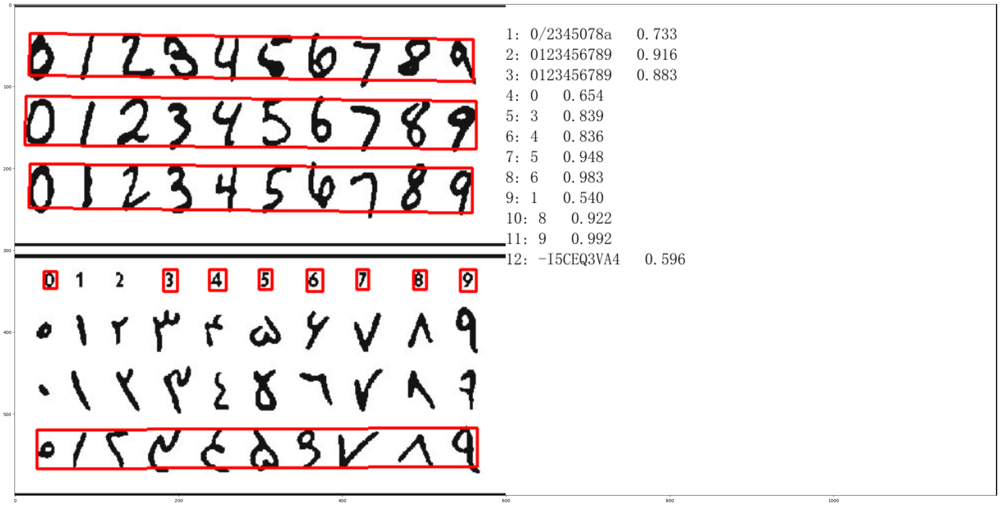

In [58]:
# draw result
from PIL import Image, ImageDraw, ImageFont

# draw result
from PIL import Image
image = Image.open(img_path).convert('RGB')
boxes = [detection[0] for line in result for detection in line] # Nested loop added
txts = [detection[1][0] for line in result for detection in line] # Nested loop added
scores = [detection[1][1] for line in result for detection in line] # Nested loop added

im_show = draw_ocr(image, boxes, txts, scores, font_path='simfang.ttf')
im_show = Image.fromarray(im_show)
im_show.save('test.jpg')
plt.figure(figsize=(40, 50))
plt.imshow(im_show)

## References

1. https://github.com/PaddlePaddle/PaddleOCR/tree/release/2.4
2. https://github.com/PaddlePaddle/PaddleOCR